# Historical Extreme Rainfall Events

Calculate the extreme rainfall event metric from the daily surface precipitation output of a climate model for the years 1994-2014. After the calculation, visualise the historical data using maps and graphs using python. <br>
The metric for extreme rainfall events is the **annual maximum precipitation amount** falling in a single day in **millimetres.**

The flow of the notebook will be as follows:

1. Download all relevant precipitation netCDF files from 1994-2014
2. Data Profiling
3. Data cleaning and pre-processing
4. Exploratory Data Analysis & Visualisation

Import relevant packages:

In [191]:
import xarray as xr
import pandas as pd
import matplotlib.pyplot as plt
from ydata_profiling import ProfileReport
import requests
import numpy as np
import netCDF4
import seaborn as sns

# 1. Downloading Relevant Files

The code below automates the download of the netCDF files. For convenience, the files have already been downloaded and are stored in the pr_day_historical folder.

In [ ]:
for year in range(1994, 2005):
    url = f'https://nex-gddp-cmip6.s3-us-west-2.amazonaws.com/NEX-GDDP-CMIP6/ACCESS-CM2/historical/r1i1p1f1/pr/pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_{year}_v1.1.nc'
    r = requests.get(url, allow_redirects=True)
    open(f'precipitation_{year}', 'wb').write(r.content)

# 2. Data Profiling

We will first load a sample dataset for exploration - historical rainfall 2014 <br>
The dataset is obtained from the NEX-GDDP-CMIP6 S3 Bucket. We only use v1.1 files as they are updated.
We convert the xarray dataset into a pandas dataframe for ease of data profiling.

In [80]:
ds3 = xr.open_dataset("pr_day_historical/pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_2014_v1.1.nc")
df3 = ds3.to_dataframe()

Summary of the xarray:

In [133]:
ds3

<xarray.Dataset> Size: 1GB
Dimensions:  (time: 365, lat: 600, lon: 1440)
Coordinates:
  * time     (time) datetime64[ns] 3kB 2014-01-01T12:00:00 ... 2014-12-31T12:...
  * lat      (lat) float64 5kB -59.88 -59.62 -59.38 -59.12 ... 89.38 89.62 89.88
  * lon      (lon) float64 12kB 0.125 0.375 0.625 0.875 ... 359.4 359.6 359.9
Data variables:
    pr       (time, lat, lon) float32 1GB nan nan nan nan ... nan nan nan nan
Attributes: (12/22)
    cmip6_source_id:       ACCESS-CM2
    cmip6_institution_id:  CSIRO-ARCCSS
    cmip6_license:         CC-BY 4.0
    activity:              NEX-GDDP-CMIP6
    contact:               Dr. Rama Nemani: rama.nemani@nasa.gov, Dr. Bridget...
    Conventions:           CF-1.7
    ...                    ...
    tracking_id:           82404e8d-0790-443b-b369-08998105081e
    title:                 ACCESS-CM2, r1i1p1f1, historical, global downscale...
    resolution_id:         0.25 degree
    history:               2023-10-26T16:41:04.348143+00:00: install global a...
    disclaimer:            This data is considered provisional and subject to...
    external_variables:    areacella

Exploring the dataframe

In [155]:
len(df3.loc['2014-01-01 12:00:00']) #number of entries for each day

864000

In [81]:
df3

pr
time                lat     lon        
2014-01-01 12:00:00 -59.875 0.125   NaN
                            0.375   NaN
                            0.625   NaN
                            0.875   NaN
                            1.125   NaN
...                                  ..
2014-12-31 12:00:00  89.875 358.875 NaN
                            359.125 NaN
                            359.375 NaN
                            359.625 NaN
                            359.875 NaN

[315360000 rows x 1 columns]

In [97]:
df3.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 315360000 entries, (Timestamp('2014-01-01 12:00:00'), -59.875, 0.125) to (Timestamp('2014-12-31 12:00:00'), 89.875, 359.875)
Data columns (total 1 columns):
 #   Column  Dtype  
---  ------  -----  
 0   pr      float32
dtypes: float32(1)
memory usage: 2.9 GB


In [98]:
df3.describe()

,pr
count,9.682428e+07
mean,2.269052e-05
std,5.136142e-05
min,0.000000e+00
25%,0.000000e+00
50%,5.253953e-07
75%,1.956667e-05
max,6.844942e-03


In [12]:
ProfileReport(df3)

Render HTML: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


From the above profiling report, here are some insights we can garner at a quick glance for the year 2014.

- The dataset has 315360000 observations. It appears that there are 864000 observations for each day, with a different precipitation reading for each latitude and longitude.
- The dataset has a multi-index of (time, lat, lon), with only 1 feature that describes each instance, which is the precipitation (mean of the daily precipitation rate).
- There are a lot of missing cells at 218535720 (69.3%), which is probably due to difficulty in collecting rainfall data at certain parts of the world. We will have to remove the null values later on.

# 3. Data Processing

After analysing one of the above datasets, we now have a better idea of the data we are dealing with. We first create a function that will help us pre-process the data:
1) We remove the null values completely. It does not make sense to impute the data with other values, given that we are trying to visualise the **maximum** precipitation amount falling in a single day for every year.

2) We then find the maximum precipitation for that year, as well as the index for that value to find the lat and long.

3) we append all 3 values into separate lists for ease of creating a new Pandas Dataframe for easily analysis later on.

In [15]:
def process_precipitation_data_v1(start_year, end_year):
    max_precipitation_list = []
    max_lat_list = []
    max_lon_list = []
    for year in range(start_year, end_year + 1):
        file_path = f"pr_day_historical/pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_{year}_v1.1.nc"
        ds = xr.open_dataset(file_path)
        df = ds.to_dataframe()
        df_cleaned = df.dropna(subset=['pr'])
        max_index = df_cleaned['pr'].idxmax() #get index of max pr
        max_pr = df_cleaned['pr'].max() #get max pr
        max_precipitation_list.append(max_pr)
        max_lat_list.append(max_index[1])
        max_lon_list.append(max_index[2])
    return max_precipitation_list, max_lat_list, max_lon_list

In [16]:
max_precipitation_year_v1 = [year for year in range(1994, 2015)]
max_precipitation_v1, max_lat, max_lon = process_precipitation_data_v1(1994, 2014)

Before creating the dataframe, we also have to convert the precipitation into millimetres. We only do it now as it saves time/space in the previous code block given that it is only scalar multiplication. The full table is as shown below:

In [17]:
max_precipitation_mm_v1 = [num * 86400 for num in max_precipitation_v1]
precipitation_df_v1 = pd.DataFrame({'maximum_precipitation': max_precipitation_mm_v1, 'lat': max_lat, 'lon': max_lon}, index=max_precipitation_year_v1)
precipitation_df_v1

,maximum_precipitation,lat,lon
1994,1660.778439,6.875,8.875
1995,2111.549520,-2.375,29.625
1996,18671.741009,-16.875,128.875
1997,42064.712334,-14.125,313.375
1998,6806.461573,-14.125,313.375
1999,5475.526285,14.875,342.375
2000,42010.288811,4.875,27.875
2001,21189.643908,4.875,27.875
2002,3333.447218,-11.125,35.125
2003,5340.823174,23.625,84.375


Short summary of final dataframe:

In [18]:
precipitation_df_v1.reset_index().rename(columns={'index':'year'}).describe()

,year,maximum_precipitation,lat,lon
count,21.000000,21.000000,21.000000,21.000000
mean,2004.000000,11336.566736,5.267857,139.684524
std,6.204837,12184.043962,15.573730,133.053230
min,1994.000000,591.403028,-16.875000,8.875000
25%,1999.000000,3082.567549,-11.125000,29.625000
50%,2004.000000,5475.526285,6.875000,84.375000
75%,2009.000000,15973.578215,14.875000,313.375000
max,2014.000000,42064.712334,29.375000,342.375000


# Data Visualisation

Now that we have the final dataframe precipitation_df_v1, we can now visualise the data.

1. Plotting annual maximum precipitation amount from 1994-2014

In [78]:
from mpl_toolkits.basemap import Basemap

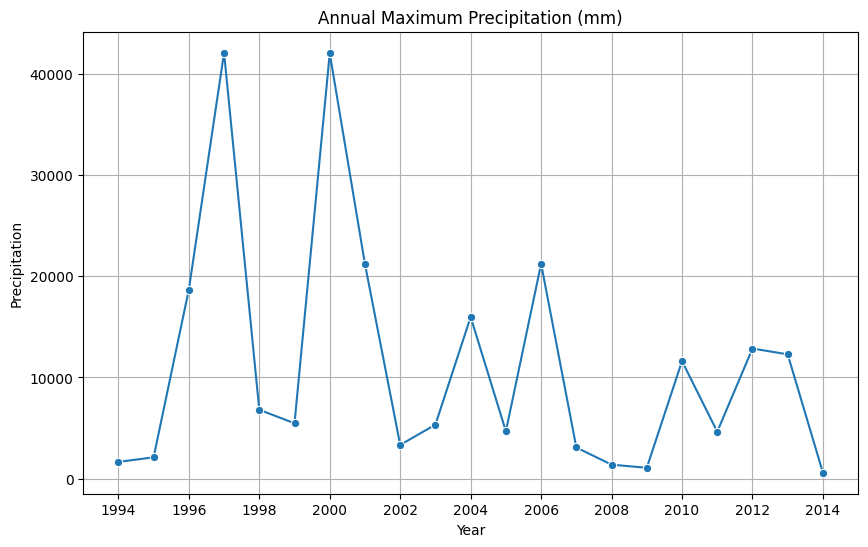

In [192]:
plt.figure(figsize=(10, 6))
sns.lineplot(data=precipitation_df_v1, x=precipitation_df_v1.index, y='maximum_precipitation', marker='o', linestyle='-')
plt.xlabel('Year')
plt.xticks(precipitation_df_v1.index.astype(int)[::2]) #show alternate years to avoid it being too cramped
plt.ylabel('Precipitation')
plt.title('Annual Maximum Precipitation (mm)')
plt.grid(True)
plt.show()

From the Data Processing section and the line chart above, we can see that the maxmimum precipitation is 42064.71mm in the year 1997, with the year 2000 following closely behind at 42010.29mm. The lowest annual maximum precipitation would be 591.40mm in the year 2014.

2. Geographical Plotting using Basemap

Sometimes, visualising the average precipitation amount for a specified area may provide better insights. <br> 
Here, we plot Average Precipitation in the South East Asia Region in the year 2014.

Extracting the individual variables and setting the lat/lon boundaries for S.E.A:

In [169]:
hist_precip = netCDF4.Dataset('pr_day_historical/pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_2014_v1.1.nc', mode='r')

In [193]:
lat_geo = hist_precip['lat'][:]
lon_geo = hist_precip['lon'][:]
time_geo = hist_precip['time'][:]
pr_geo = hist_precip['pr'][:]

#S.E.A latitude and longitude boundaries
lower_left_lon = 88.022584
lower_left_lat = -11.843234
upper_right_lon = 131.650515
upper_right_lat = 29.927044

Utilising Matplotlib Basemap package:

In [197]:
def sea_precipitation_2014(day: int):
    if day not in range(0, 365):
        raise ValueError("Invalid year input. Please input values from 0 to 364 only.")
    #setting lower left lat/lon and upper left/right lat lon for map boundaries, with Mercator Projection.
    mp = Basemap(projection='merc', llcrnrlon=lower_left_lon, llcrnrlat=lower_left_lat, urcrnrlon=upper_right_lon, urcrnrlat=upper_right_lat, resolution='i') 
    lon, lat = np.meshgrid(lon_geo, lat_geo)
    x,y = mp(lon, lat)
    colours = mp.pcolor(x, y, np.squeeze(pr_geo[day,:,:])*86400, cmap='jet') #convert to mm
    mp.drawcoastlines()
    mp.drawstates()
    mp.drawcountries()
    cbar = mp.colorbar(colours, location='right', pad='10%')
    plt.title(f'Average precipitation (mm) in South East Asia on day {day+1} of 2014')
    plt.show()

Call the function with values from 0-364 to view the plot for each day:

C:\Users\enyan\AppData\Local\Temp\ipykernel_24116\3402203518.py:12: MatplotlibDeprecationWarning: Getting the array from a PolyQuadMesh will return the full array in the future (uncompressed). To get this behavior now set the PolyQuadMesh with a 2D array .set_array(data2d).
  cbar = mp.colorbar(colours, location='right', pad='10%')


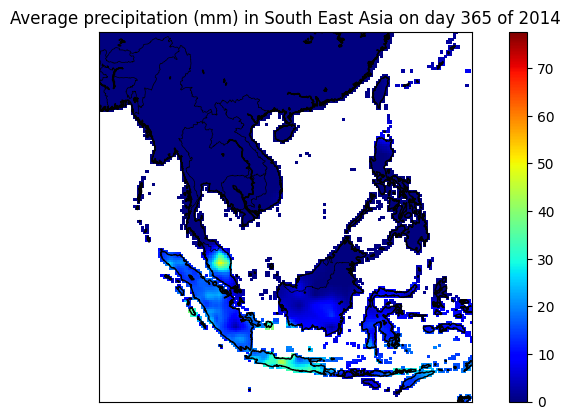

In [198]:
sea_precipitation_2014(364)

# Miscellaneous Exploration

3. Time series data from geographical coordinates: Finding the average daily precipitation of Hougang (where I stay) in the year 2014.

In [150]:
# Storing lat and lon of Hougang, Singapore into variables
lat_hougang = 1.371778
lon_hougang = 103.893059 

The function below plots the daily precipitation for the selected year for a given input latitude and longitude. <br> 
However, it is important to note that the dataset may not contain the exact input latitudes and longitudes, and hence we find the closest lat/long using the minimum squared distance from all the lat/lon in the dataset and the input lat/lon.

In [183]:
def plot_historical_precipitation(year, input_lat, input_lon):
    #read dataset for selected year
    hist_precip = netCDF4.Dataset(f'pr_day_historical/pr_day_ACCESS-CM2_historical_r1i1p1f1_gn_{year}_v1.1.nc', mode='r')

    #accessing the variables
    time = hist_precip.variables['time']
    pr = hist_precip.variables['pr']
    lat = hist_precip.variables['lat']
    lon = hist_precip.variables['lon']

    # Storing lat and lon areas
    lat_total = lat[:]
    lon_total = lon[:]

    # Squared difference of lat and lon
    sq_diff_lat = (lat_total - input_lat)**2
    sq_diff_lon = (lon_total - input_lon)**2

    # Index of minimum value of squared difference of lat and lon
    min_index_lat = sq_diff_lat.argmin()
    min_index_lon = sq_diff_lon.argmin()

    print("Index of closest Lat & Long:", min_index_lat, min_index_lon)

    # Create new dataframe
    date_range = pd.date_range(start=f'{year}-01-01', end=f'{year}-12-31')
    df = pd.DataFrame(0, columns=['Precipitation'], index = date_range)

    # Fill dataframe with relevant precipitation values from the closest lat/lon
    for date in range(0, time.size):
        df.iloc[date] = pr[date, min_index_lat, min_index_lon]

    # Convert to mm
    df['Precipitation'] = df['Precipitation'].apply(lambda x: x*86400)

    # Plot Daily Precipitation
    plt.figure(figsize=(15, 10))
    sns.lineplot(data=df, x=df.index, y='Precipitation', marker='o', linestyle='-')
    plt.xlabel('Date')
    plt.ylabel('Precipitation')
    plt.title('Daily Precipitation in millimeters')
    plt.show()

    return df #return the dataframe in case more analysis is needed

Index of closest Lat & Long: 245 415


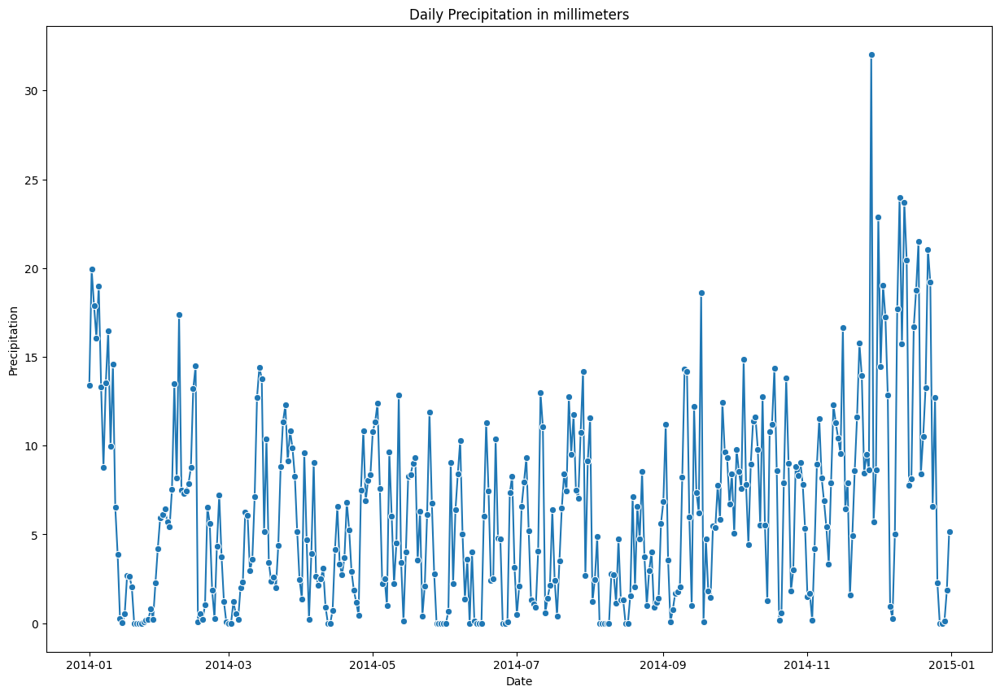

,Precipitation
2014-01-01,13.391363
2014-01-02,19.925391
2014-01-03,17.903686
2014-01-04,16.066935
2014-01-05,19.005672
...,...
2014-12-27,0.000000
2014-12-28,0.000000
2014-12-29,0.133511
2014-12-30,1.847459


In [184]:
daily_precipitation_df = plot_historical_precipitation(2014, lat_hougang, lon_hougang)
daily_precipitation_df

Using the closest lat/lon from Hougang in the dataset, it is actually at Serangoon North Ave 5, just 2.5km away from my house.

In [165]:
print(hist_precip['lat'][245], hist_precip['lon'][415])

1.375 103.875


The above daily line graph seems to be very cluttered. Alternatively, it it may be more clear to view the monthly fluctuations of precipitation.

In [167]:
monthly_precipitation_df = daily_precipitation_df.groupby(pd.Grouper(freq='M')).mean()
monthly_precipitation_df

,Precipitation
2014-01-31,6.303948
2014-02-28,6.055073
2014-03-31,5.860817
2014-04-30,4.048496
2014-05-31,5.342041
2014-06-30,3.990750
2014-07-31,6.046403
2014-08-31,2.758142
2014-09-30,6.507133
2014-10-31,7.919096


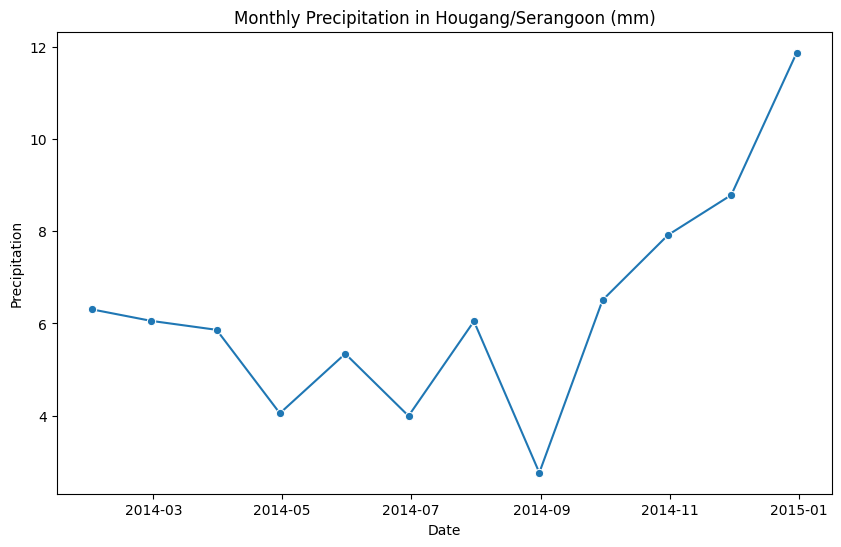

In [190]:
plt.figure(figsize=(10, 6))
sns.lineplot(data=monthly_precipitation_df, x=monthly_precipitation_df.index, y='Precipitation', marker='o', linestyle='-')
plt.xlabel('Date')
plt.ylabel('Precipitation')
plt.title('Monthly Precipitation in Hougang/Serangoon (mm)')
plt.show()

From the chart above, it seems that the months of November-January have the highest rainfall or precipitation, with the highest precipitation being in January. This is supported by [weather.gov.sg](http://www.weather.gov.sg/climate-climate-of-singapore/), where higher rainfall occurs from November to January during the wet phase of Northeast Monsoon season.